# Wasserstein GAN with Gradient Penalty (WGAN-GP)

### Goals
In this notebook, you're going to build a Wasserstein GAN with Gradient Penalty (WGAN-GP) that solves some of the stability issues with the GANs that you have been using up until this point. Specifically, you'll use a special kind of loss function known as the W-loss, where W stands for Wasserstein, and gradient penalties to prevent mode collapse.

*Fun Fact: Wasserstein is named after a mathematician at Penn State, Leonid Vaseršteĭn. You'll see it abbreviated to W (e.g. WGAN, W-loss, W-distance).*

### Learning Objectives
1.   Get hands-on experience building a more stable GAN: Wasserstein GAN with Gradient Penalty (WGAN-GP).
2.   Train the more advanced WGAN-GP model.



## Generator and Critic

You will begin by importing some useful packages, defining visualization functions, building the generator, and building the critic. Since the changes for WGAN-GP are done to the loss function during training, you can simply reuse your previous GAN code for the generator and critic class. Remember that in WGAN-GP, you no longer use a discriminator that classifies fake and real as 0 and 1 but rather a critic that scores images with real numbers.

#### Packages and Visualizations

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

def make_grad_hook():
    '''
    Function to keep track of gradients for visualization purposes, 
    which fills the grads list when using model.apply(grad_hook).
    '''
    grads = []
    def grad_hook(m):
        if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
            grads.append(m.weight.grad)
    return grads, grad_hook

#### Generator and Noise

In [2]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(z_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN;
        a transposed convolution, a batchnorm (except in the final layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh(),
            )

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor,
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        x = noise.view(len(noise), self.z_dim, 1, 1)
        return self.gen(x)

def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
      n_samples: the number of samples to generate, a scalar
      z_dim: the dimension of the noise vector, a scalar
      device: the device type
    '''
    return torch.randn(n_samples, z_dim, device=device)

#### Critic

In [3]:
class Critic(nn.Module):
    '''
    Critic Class
    Values:
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Critic, self).__init__()
        self.crit = nn.Sequential(
            self.make_crit_block(im_chan, hidden_dim),
            self.make_crit_block(hidden_dim, hidden_dim * 2),
            self.make_crit_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_crit_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a critic block of DCGAN;
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the critic: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        crit_pred = self.crit(image)
        return crit_pred.view(len(crit_pred), -1)

## Training Initializations
Now you can start putting it all together.
As usual, you will start by setting the parameters:
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   beta_1, beta_2: the momentum terms
  *   c_lambda: weight of the gradient penalty
  *   crit_repeats: number of times to update the critic per generator update - there are more details about this in the *Putting It All Together* section
  *   device: the device type

You will also load and transform the MNIST dataset to tensors.




In [4]:
n_epochs = 100
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.0002
beta_1 = 0.5
beta_2 = 0.999
c_lambda = 10
crit_repeats = 5
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=False, transform=transform),
    batch_size=batch_size,
    shuffle=True)

Then, you can initialize your generator, critic, and optimizers.

In [5]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
crit = Critic().to(device) 
crit_opt = torch.optim.Adam(crit.parameters(), lr=lr, betas=(beta_1, beta_2))

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
crit = crit.apply(weights_init)


## Gradient Penalty
Calculating the gradient penalty can be broken into two functions: (1) compute the gradient with respect to the images and (2) compute the gradient penalty given the gradient.

You can start by getting the gradient. The gradient is computed by first creating a mixed image. This is done by weighing the fake and real image using epsilon and then adding them together. Once you have the intermediate image, you can get the critic's output on the image. Finally, you compute the gradient of the critic score's on the mixed images (output) with respect to the pixels of the mixed images (input). You will need to fill in the code to get the gradient wherever you see *None*. There is a test function in the next block for you to test your solution.

In [1]:
def get_gradient(crit, real, fake, epsilon):
    '''
    Return the gradient of the critic's scores with respect to mixes of real and fake images.
    Parameters:
        crit: the critic model
        real: a batch of real images
        fake: a batch of fake images
        epsilon: a vector of the uniformly random proportions of real/fake per mixed image
    Returns:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    '''
    # Mix the images together
    mixed_images = real * epsilon + fake * (1 - epsilon)

    # Calculate the critic's scores on the mixed images
    mixed_scores = crit(mixed_images)
    
    # Take the gradient of the scores with respect to the images
    # Note: You need to take the gradient of outputs with respect to inputs.
    # This documentation may be useful, but it should not be necessary:
    # https://pytorch.org/docs/stable/autograd.html#torch.autograd.grad
    # These other parameters have to do with the pytorch autograd engine works
    gradient = torch.autograd.grad(inputs=mixed_images,
                                   outputs=mixed_scores,
                                   grad_outputs=torch.ones_like(mixed_scores), 
                                   create_graph=True,
                                   retain_graph=True)[0]
    return gradient

The second function you need to complete is to compute the gradient penalty given the gradient. First, you calculate the magnitude of each image's gradient. The magnitude of a gradient is also called the norm. Then, you calculate the penalty by squaring the distance between each magnitude and the ideal norm of 1 and taking the mean of all the squared distances.

Again, you will need to fill in the code wherever you see *None*. There are hints below that you can view if you need help and there is a test function in the next block for you to test your solution.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">gradient_penalty</font></code></b>
</font>
</summary>


1.   Make sure you take the mean at the end.
2.   Note that the magnitude of each gradient has already been calculated for you.

</details>


In [2]:
def gradient_penalty(gradient):
    '''
    Return the gradient penalty, given a gradient.
    Given a batch of image gradients, you calculate the magnitude of each image's gradient
    and penalize the mean quadratic distance of each magnitude to 1.
    Parameters:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    Returns:
        penalty: the gradient penalty
    '''
    # Flatten the gradients so that each row captures one image
    gradient = gradient.view(len(gradient), -1)

    # Calculate the magnitude of every row
    gradient_norm = gradient.norm(2, dim=1)
    
    # Penalize the mean squared distance of the gradient norms from 1
    penalty = torch.mean((gradient_norm - 1)**2)
    return penalty

## Losses
Next, you need to calculate the loss for the generator and the critic.

For the generator, the loss is calculated by maximizing the critic's prediction on the generator's fake images. The argument has the scores for all fake images in the batch, but you will use the mean of them.

There are optional hints below and a test function in the next block for you to test your solution.

<details><summary><font size="3" color="green"><b>Optional hints for <code><font size="4">get_gen_loss</font></code></b></font></summary>

1. This can be written in one line.
2. This is the negative of the mean of the critic's scores.

</details>

In [3]:
def get_gen_loss(crit_fake_pred):
    '''
    Return the loss of a generator given the critic's scores of the generator's fake images.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
    Returns:
        gen_loss: a scalar loss value for the current batch of the generator
    '''
    gen_loss = -1. * torch.mean(crit_fake_pred)
    return gen_loss

For the critic, the loss is calculated by maximizing the distance between the critic's predictions on the real images and the predictions on the fake images while also adding a gradient penalty. The gradient penalty is weighed according to lambda. The arguments are the scores for all the images in the batch, and you will use the mean of them.

There are hints below if you get stuck and a test function in the next block for you to test your solution.

<details><summary><font size="3" color="green"><b>Optional hints for <code><font size="4">get_crit_loss</font></code></b></font></summary>

1. The higher the mean fake score, the higher the critic's loss is.
2. What does this suggest about the mean real score?
3. The higher the gradient penalty, the higher the critic's loss is, proportional to lambda.


</details>


In [4]:
def get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda):
    '''
    Return the loss of a critic given the critic's scores for fake and real images,
    the gradient penalty, and gradient penalty weight.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
        crit_real_pred: the critic's scores of the real images
        gp: the unweighted gradient penalty
        c_lambda: the current weight of the gradient penalty 
    Returns:
        crit_loss: a scalar for the critic's loss, accounting for the relevant factors
    '''
    crit_loss = torch.mean(crit_fake_pred) - torch.mean(crit_real_pred) + c_lambda * gp
    return crit_loss

## Putting It All Together
Before you put everything together, there are a few things to note.
1.   Even on GPU, the **training will run more slowly** than previous labs because the gradient penalty requires you to compute the gradient of a gradient -- this means potentially a few minutes per epoch! For best results, run this for as long as you can while on GPU.
2.   One important difference from earlier versions is that you will **update the critic multiple times** every time you update the generator This helps prevent the generator from overpowering the critic. Sometimes, you might see the reverse, with the generator updated more times than the critic. This depends on architectural (e.g. the depth and width of the network) and algorithmic choices (e.g. which loss you're using). 
3.   WGAN-GP isn't necessarily meant to improve overall performance of a GAN, but just **increases stability** and avoids mode collapse. In general, a WGAN will be able to train in a much more stable way than the vanilla DCGAN from last assignment, though it will generally run a bit slower. You should also be able to train your model for more epochs without it collapsing.


<!-- Once again, be warned that this runs very slowly on a CPU. One way to run this more quickly is to download the .ipynb and upload it to Google Drive, then open it with Google Colab and make the runtime type GPU and replace
`device = "cpu"`
with
`device = "cuda"`
and make sure that your `get_noise` function uses the right device.  -->

Here is a snapshot of what your WGAN-GP outputs should resemble:
![MNIST Digits Progression](MNIST_WGAN_Progression.png)

Epoch 1, step 500: Generator loss: 5.34184058953682, critic loss: -115.07031634650968


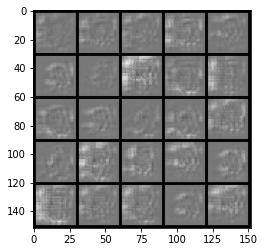

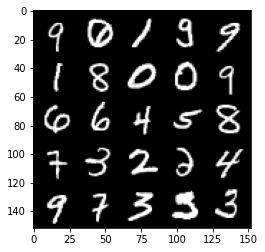

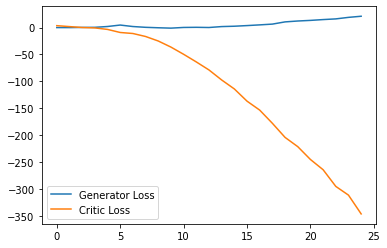

Epoch 2, step 1000: Generator loss: -8.189052510976792, critic loss: -307.9551264221193


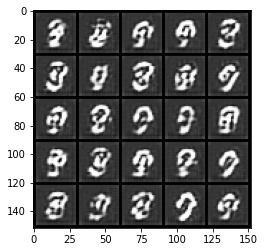

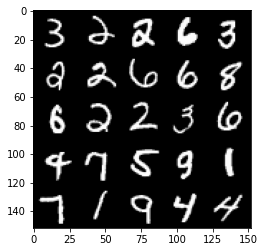

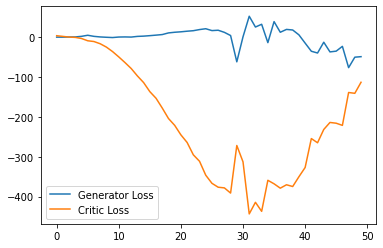

Epoch 3, step 1500: Generator loss: 12.665097542524338, critic loss: 24.722888009262082


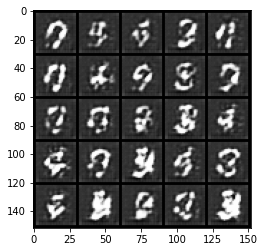

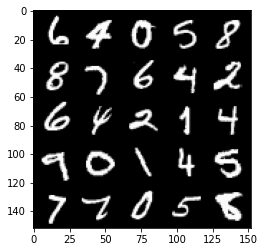

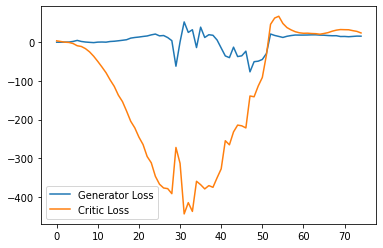

Epoch 4, step 2000: Generator loss: 20.679404233932495, critic loss: -6.832707590866085


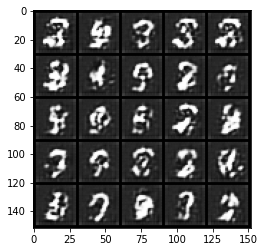

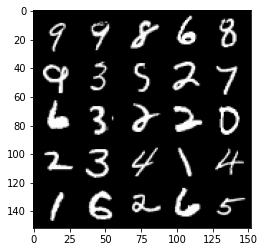

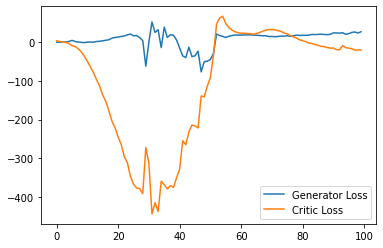

Epoch 5, step 2500: Generator loss: 30.774807935714723, critic loss: -15.925395906639087


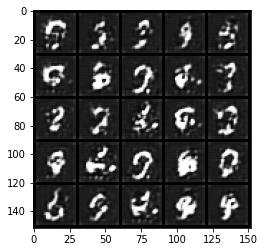

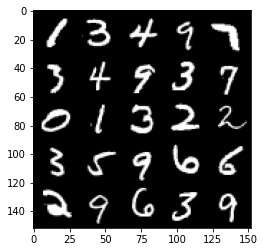

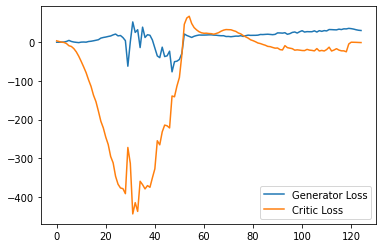

Epoch 6, step 3000: Generator loss: 29.786589988708496, critic loss: -3.5309743629455563


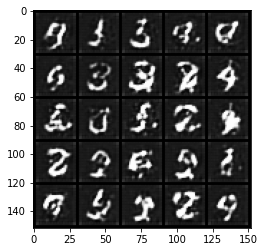

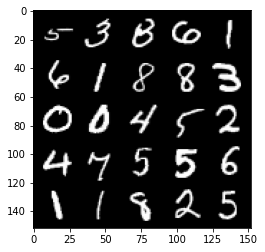

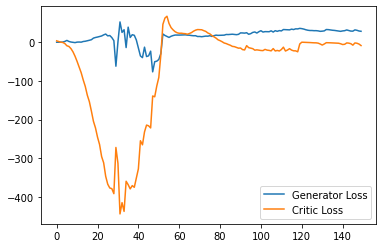

Epoch 7, step 3500: Generator loss: 31.024087463378905, critic loss: -13.965037812185276


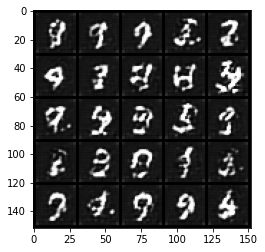

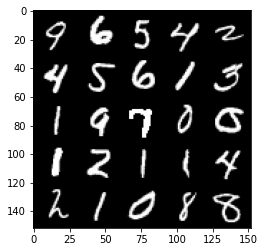

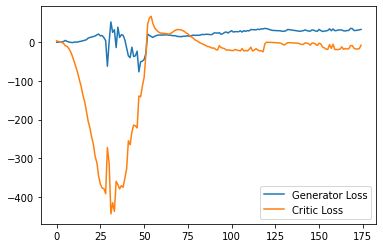

Epoch 8, step 4000: Generator loss: 36.56210591888428, critic loss: -8.030872272634504


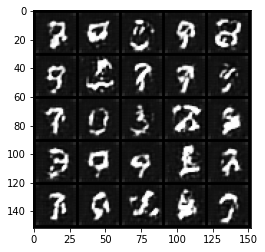

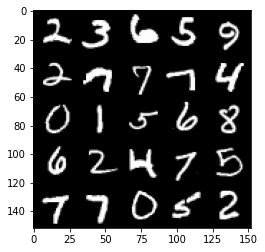

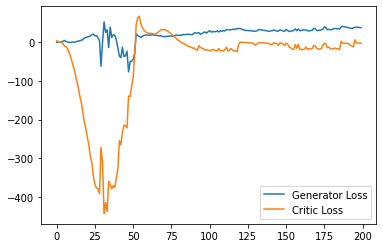

Epoch 9, step 4500: Generator loss: 37.008216819763184, critic loss: -6.957194044446952


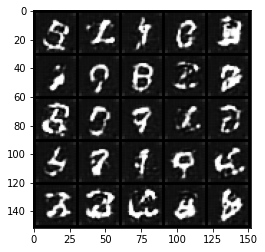

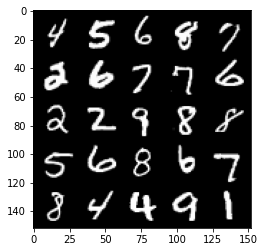

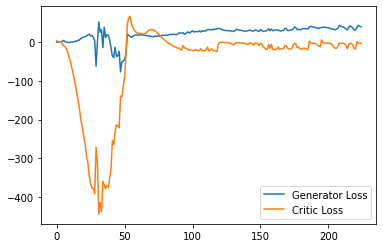

Epoch 10, step 5000: Generator loss: 35.69877714538574, critic loss: -7.9716993029117615


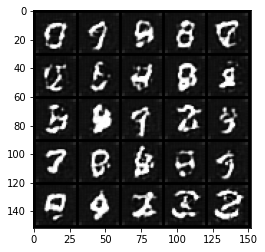

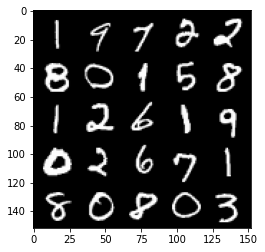

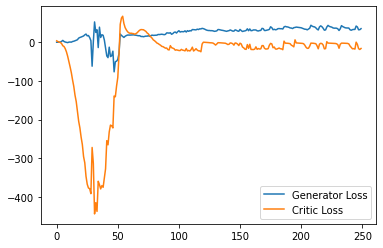

Epoch 11, step 5500: Generator loss: 35.67393453168869, critic loss: -6.940297021675113


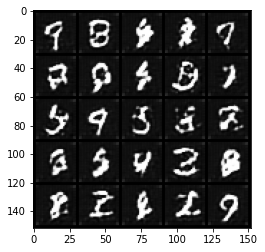

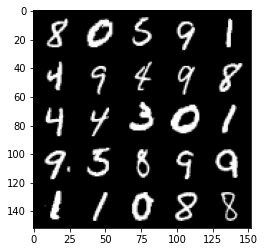

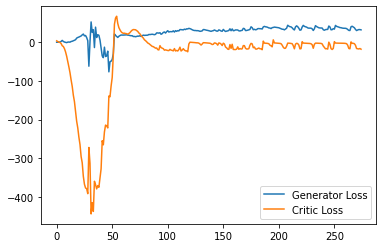

Epoch 12, step 6000: Generator loss: 35.86518576049804, critic loss: -7.436150396490095


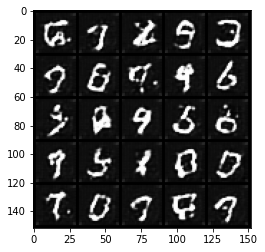

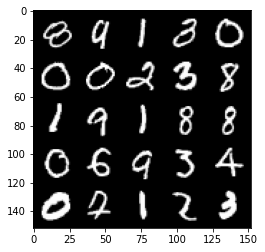

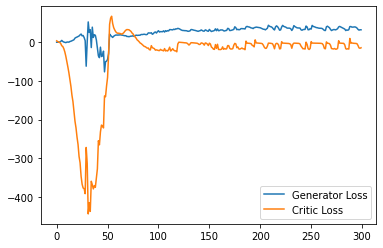

Epoch 13, step 6500: Generator loss: 31.2021246509552, critic loss: -13.754871892571451


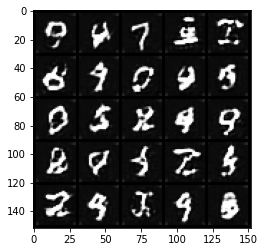

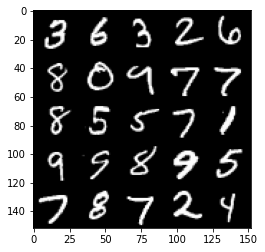

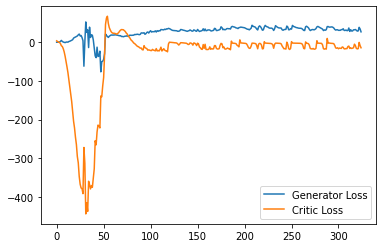

Epoch 14, step 7000: Generator loss: 31.843810741424562, critic loss: -7.705068968701359


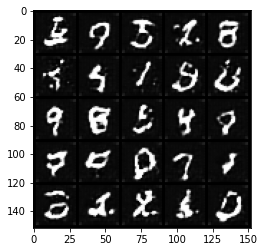

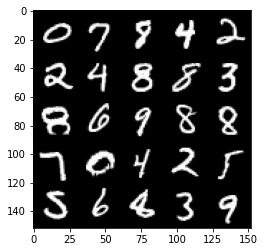

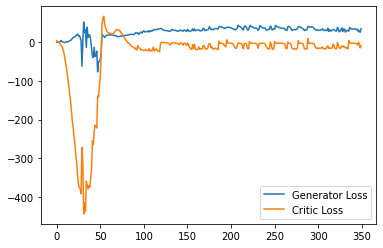

Epoch 15, step 7500: Generator loss: 31.194200344085694, critic loss: -9.348249709224703


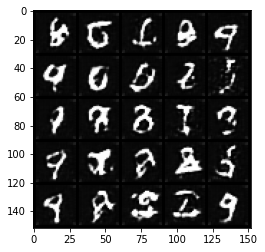

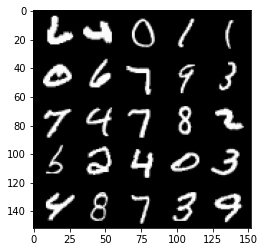

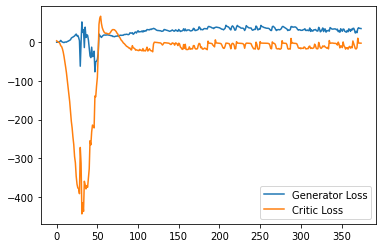

Epoch 17, step 8000: Generator loss: 30.482995584487917, critic loss: -10.899474526786804


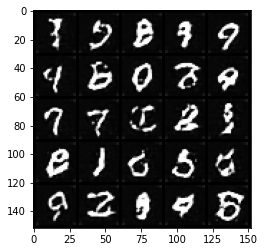

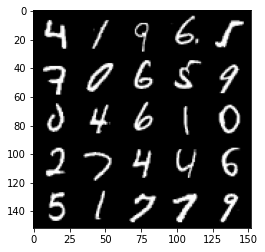

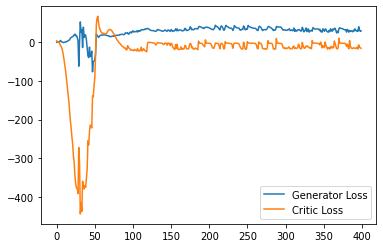

Epoch 18, step 8500: Generator loss: 32.49406904220581, critic loss: -12.707428640341751


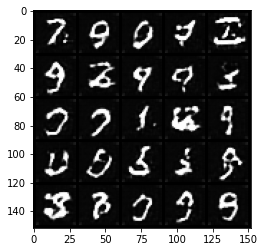

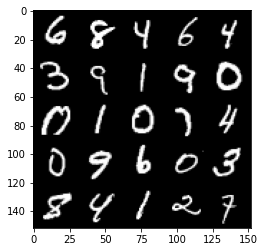

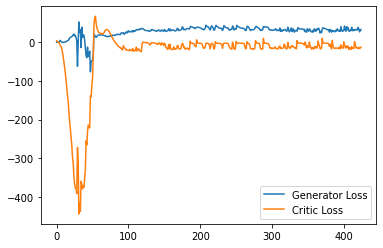

Epoch 19, step 9000: Generator loss: 35.495761293411256, critic loss: -11.484914080071446


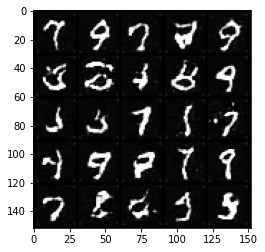

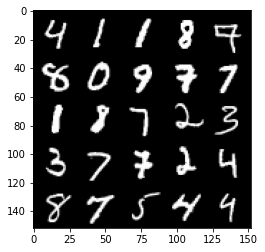

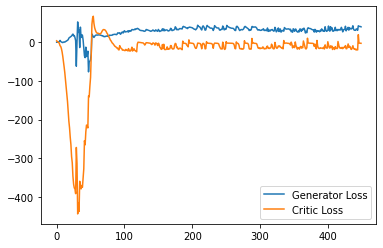

Epoch 20, step 9500: Generator loss: 35.67623245620727, critic loss: -11.550070897173885


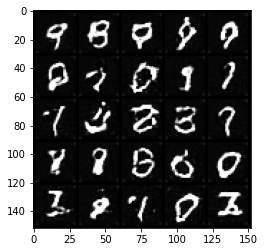

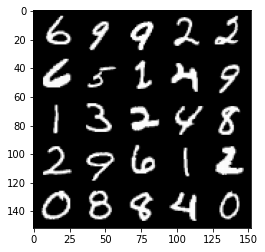

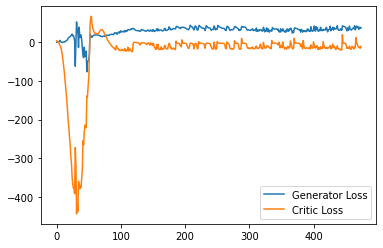

Epoch 21, step 10000: Generator loss: 37.316272998809815, critic loss: -12.558244619154943


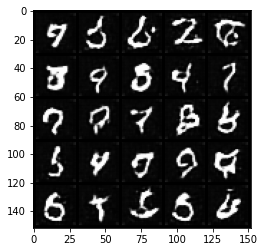

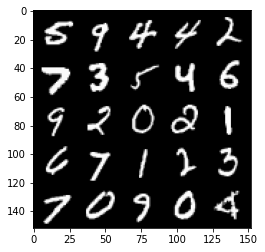

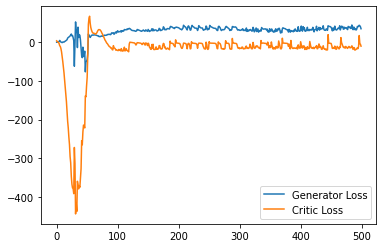

Epoch 22, step 10500: Generator loss: 37.95581554794312, critic loss: -14.61468740050792


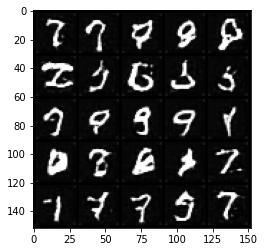

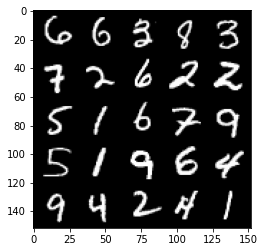

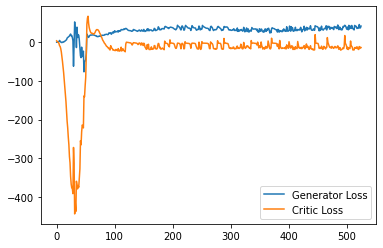

Epoch 23, step 11000: Generator loss: 39.30292511749268, critic loss: -13.72064200508595


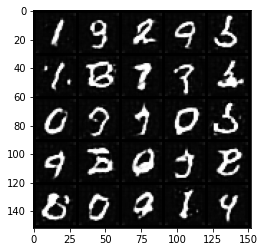

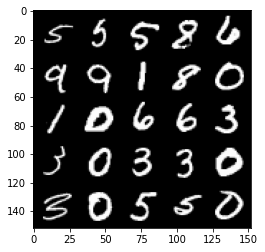

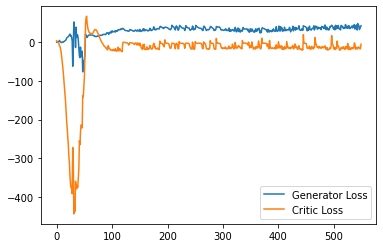

Epoch 24, step 11500: Generator loss: 40.203108953475954, critic loss: -14.208363402760035


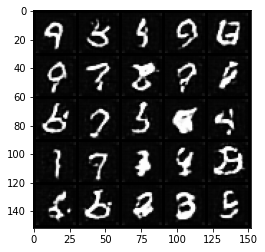

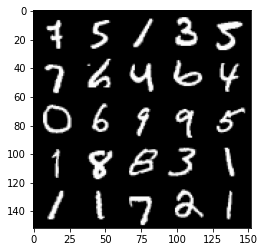

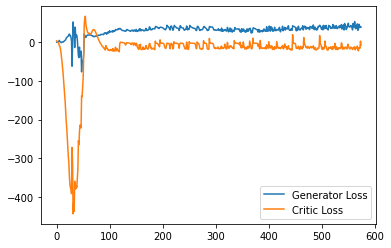

Epoch 25, step 12000: Generator loss: 40.6071688117981, critic loss: -14.391050229692452


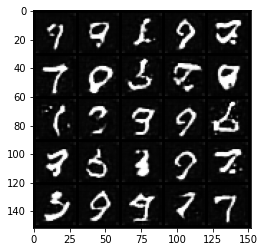

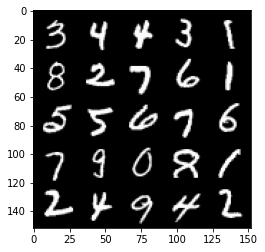

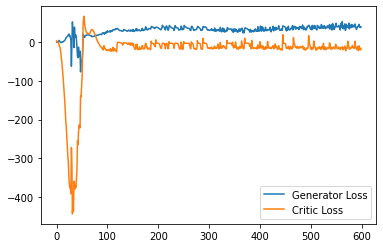

Epoch 26, step 12500: Generator loss: 40.30247530937195, critic loss: -13.677710965764529


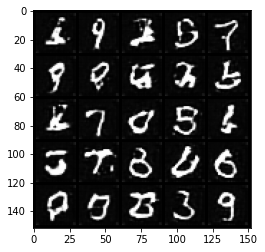

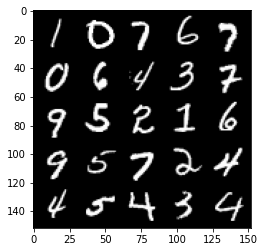

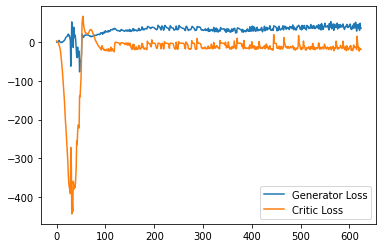

Epoch 27, step 13000: Generator loss: 40.31449910354614, critic loss: -14.084038838732255


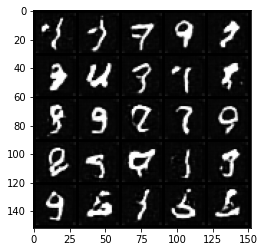

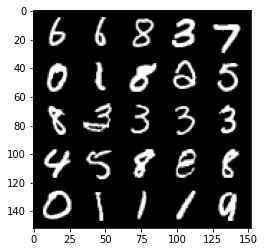

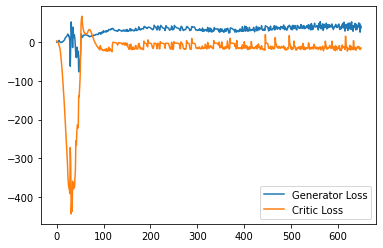

Epoch 28, step 13500: Generator loss: 43.64529939079285, critic loss: -12.951552000522604


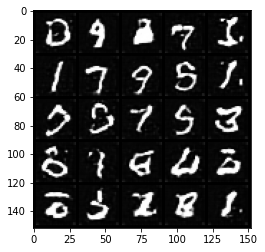

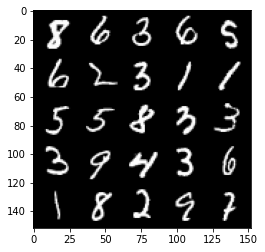

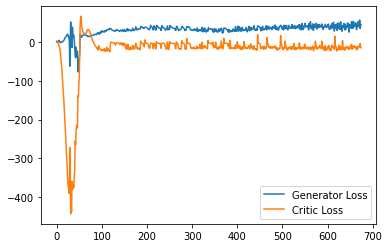

Epoch 29, step 14000: Generator loss: 44.504380390167235, critic loss: -13.721961962866773


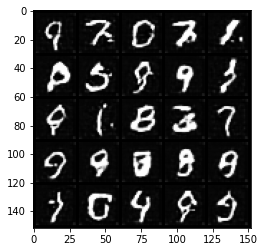

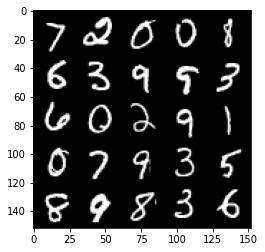

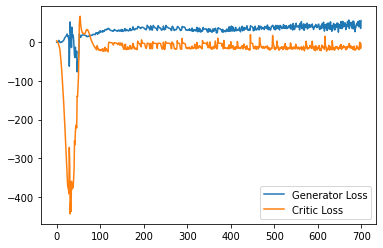

Epoch 30, step 14500: Generator loss: 45.54565403366089, critic loss: -14.04387685509919


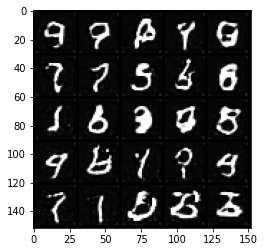

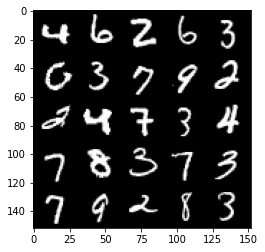

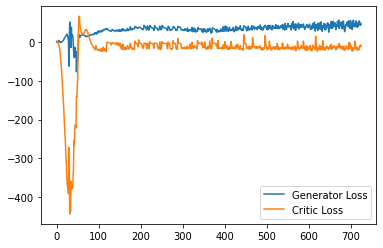

Epoch 31, step 15000: Generator loss: 47.4436608543396, critic loss: -12.73905657138824


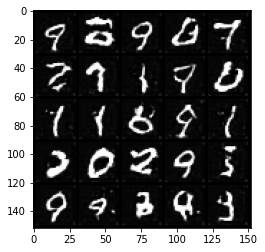

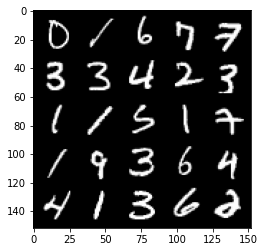

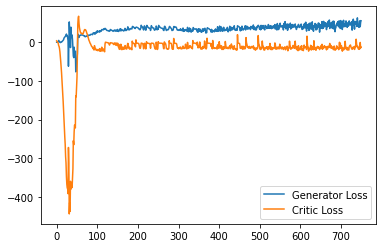

Epoch 33, step 15500: Generator loss: 48.24054872131347, critic loss: -13.926940615355964


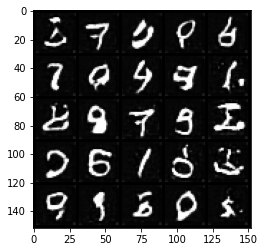

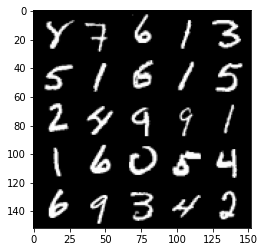

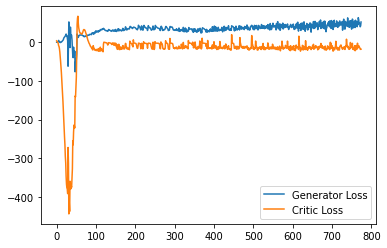

Epoch 34, step 16000: Generator loss: 47.44325782251358, critic loss: -14.145730758225923


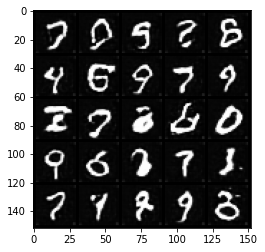

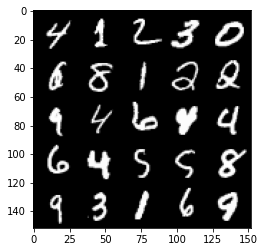

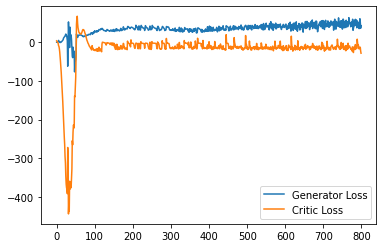

Epoch 35, step 16500: Generator loss: 48.77824793720245, critic loss: -14.097432119321814


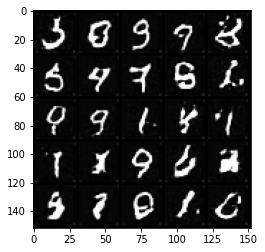

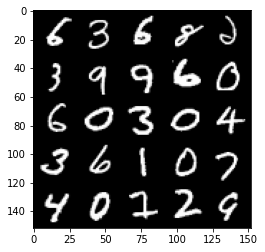

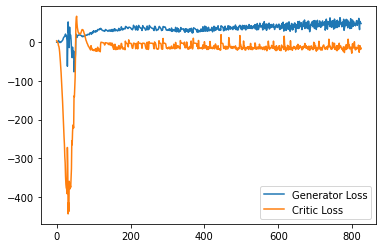

Epoch 36, step 17000: Generator loss: 51.52887746429443, critic loss: -14.68906686342955


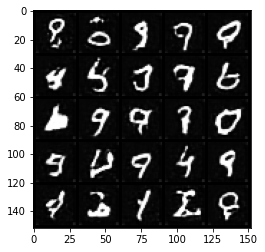

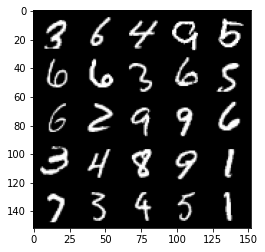

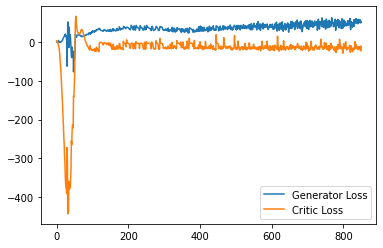

Epoch 37, step 17500: Generator loss: 53.0080138130188, critic loss: -14.745936010217664


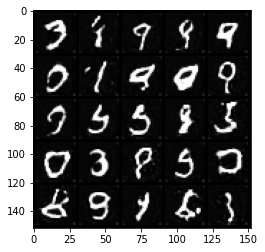

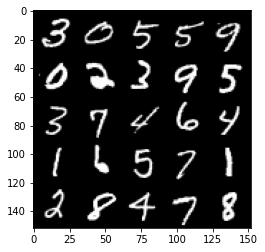

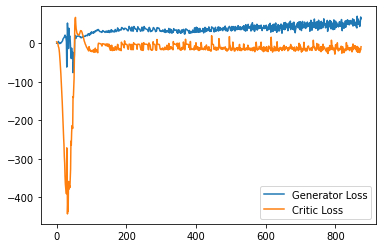

Epoch 38, step 18000: Generator loss: 55.18156494188309, critic loss: -11.95287996771335


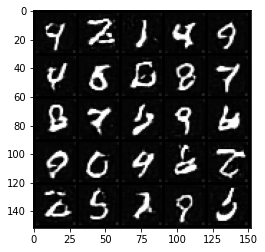

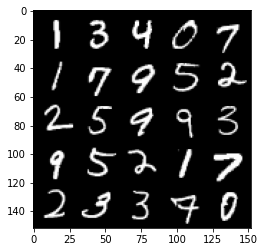

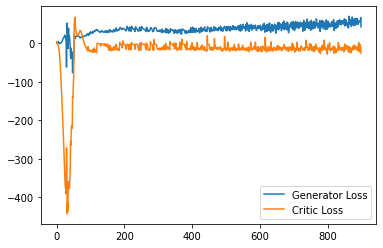

Epoch 39, step 18500: Generator loss: 56.09606027030945, critic loss: -14.226300018864874


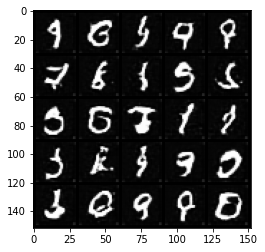

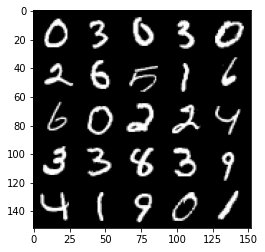

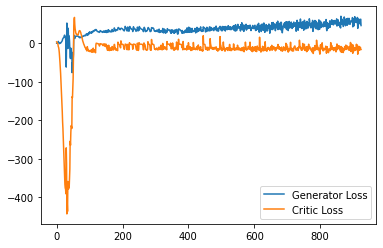

Epoch 40, step 19000: Generator loss: 58.9363283367157, critic loss: -10.577115932452667


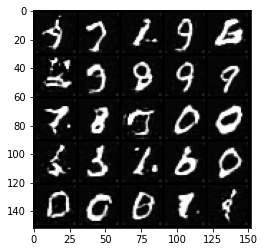

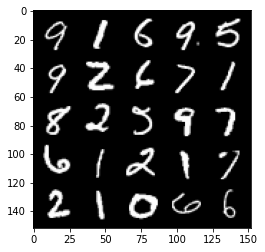

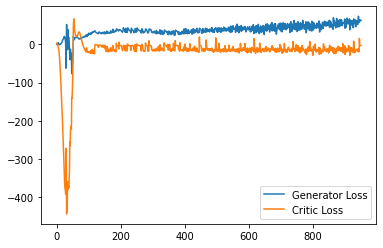

Epoch 41, step 19500: Generator loss: 60.336230922698974, critic loss: -13.90734356589319


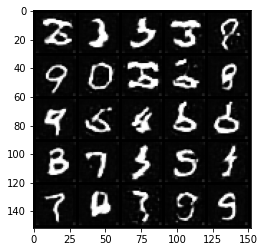

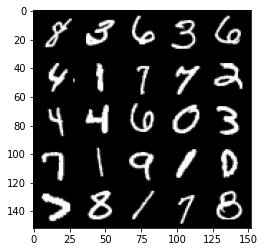

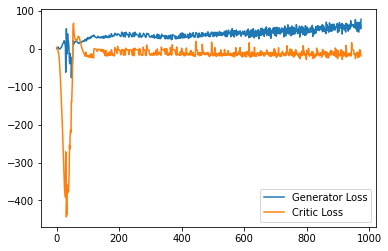

Epoch 42, step 20000: Generator loss: 62.70885413742065, critic loss: -15.61993335157634


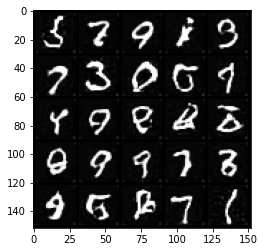

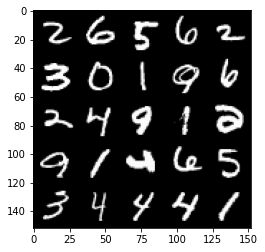

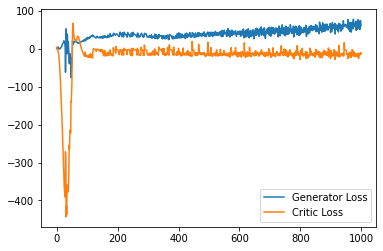

Epoch 43, step 20500: Generator loss: 63.767938230514524, critic loss: -15.16887857491373


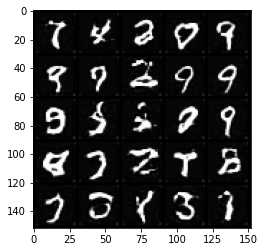

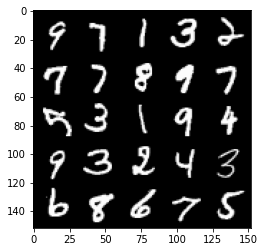

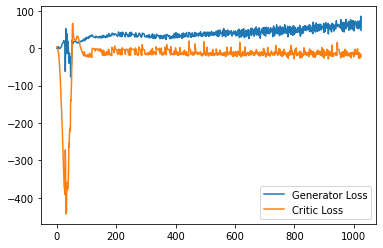

Epoch 44, step 21000: Generator loss: 69.62404247283935, critic loss: -16.037002525937545


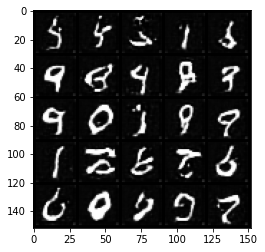

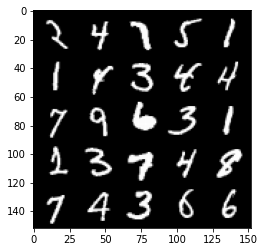

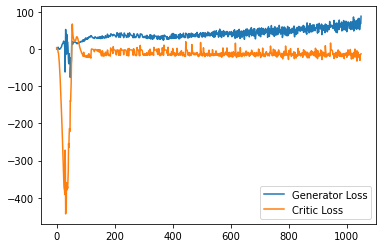

Epoch 45, step 21500: Generator loss: 73.01684105682374, critic loss: -13.310561272001262


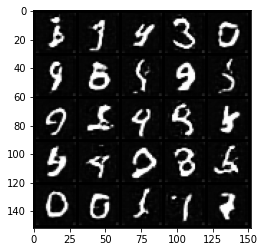

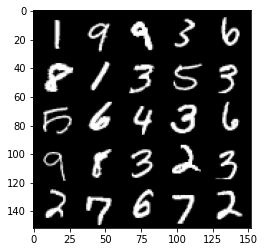

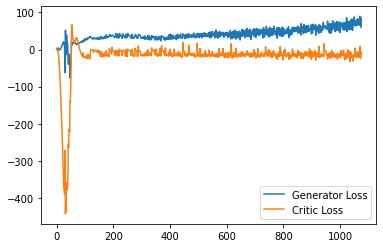

Epoch 46, step 22000: Generator loss: 74.89864086532593, critic loss: -14.097500774347768


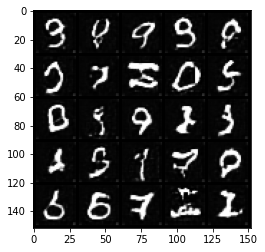

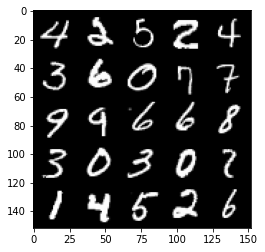

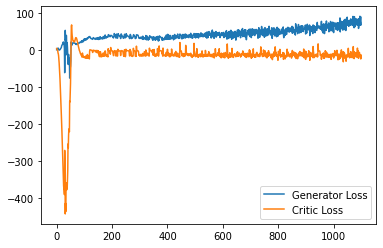

Epoch 47, step 22500: Generator loss: 77.10983352661133, critic loss: -15.111366239452382


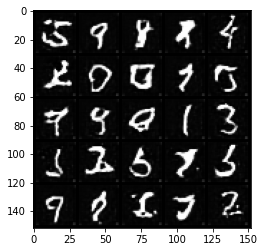

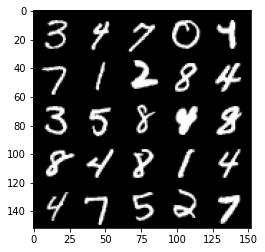

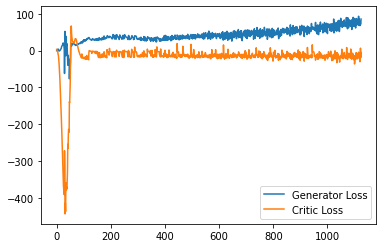

Epoch 49, step 23000: Generator loss: 76.75569685745239, critic loss: -11.476606365990635


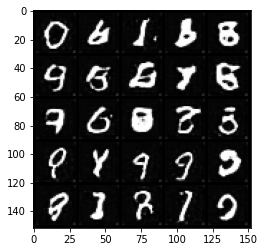

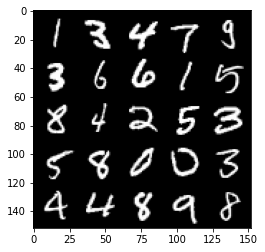

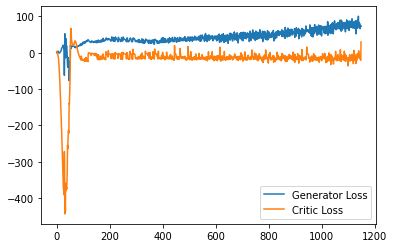

Epoch 50, step 23500: Generator loss: 84.32454602050781, critic loss: -8.052516234147548


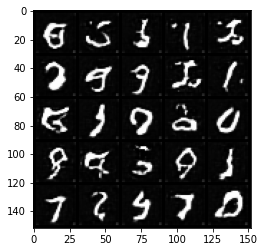

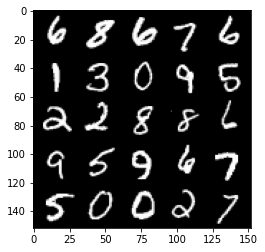

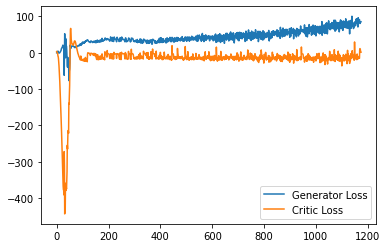

Epoch 51, step 24000: Generator loss: 88.05926278686523, critic loss: -1.2731361114740367


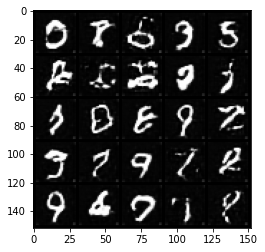

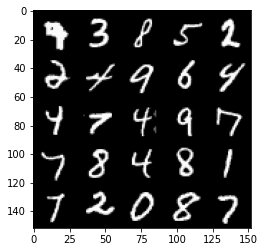

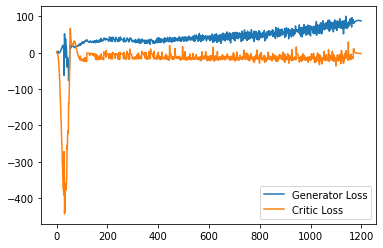

Epoch 52, step 24500: Generator loss: 86.9662465057373, critic loss: -2.1154690618991836


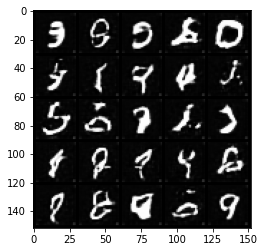

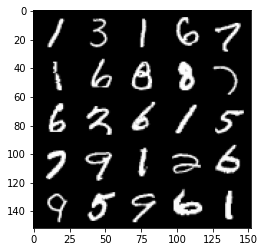

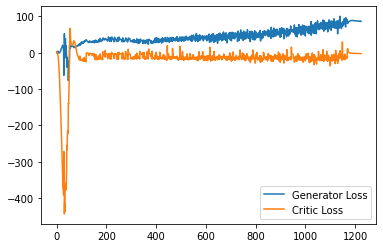

Epoch 53, step 25000: Generator loss: 87.04119692993164, critic loss: -2.418634700965882


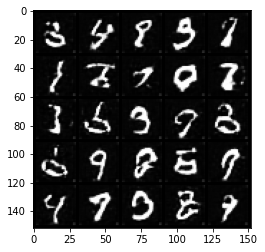

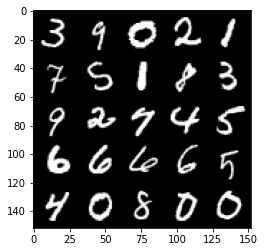

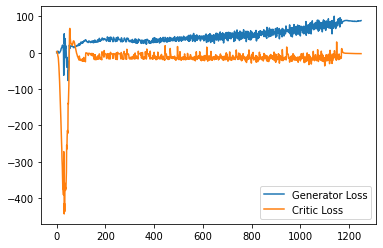

Epoch 54, step 25500: Generator loss: 88.32722436523437, critic loss: -2.771619045782092


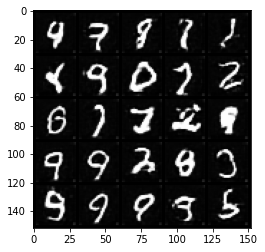

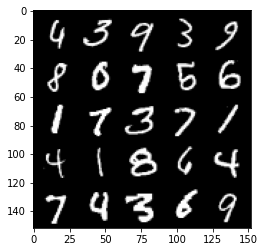

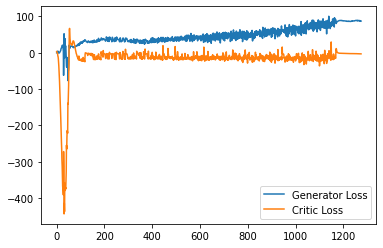

Epoch 55, step 26000: Generator loss: 87.61380921936035, critic loss: -3.2956375046491604


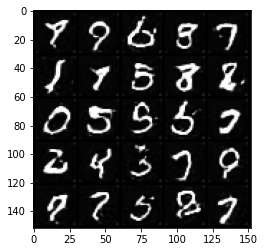

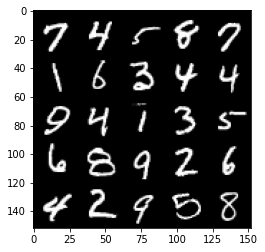

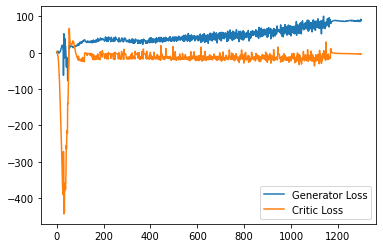

Epoch 56, step 26500: Generator loss: 89.36638938903809, critic loss: -4.095193971908093


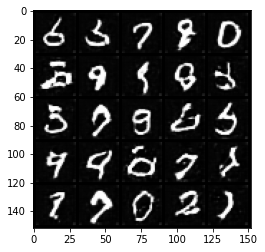

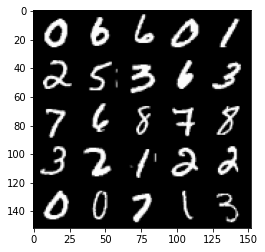

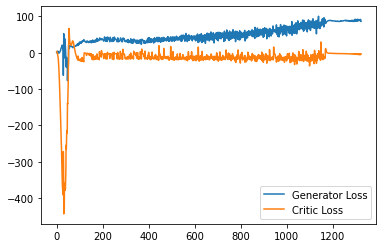

Epoch 57, step 27000: Generator loss: 89.02519413757324, critic loss: -4.427631304168702


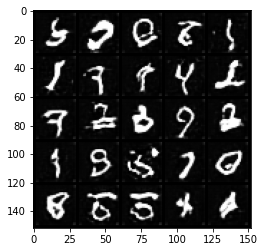

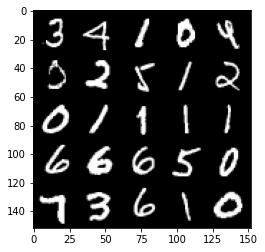

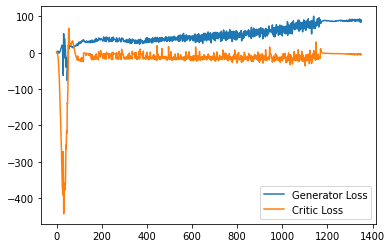

Epoch 58, step 27500: Generator loss: 87.42879197692871, critic loss: -4.608668208134174


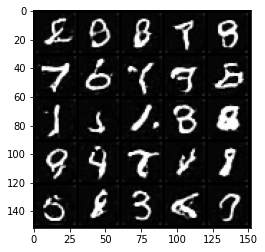

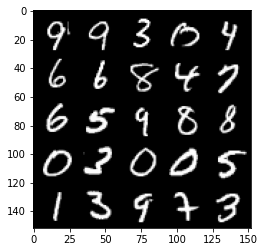

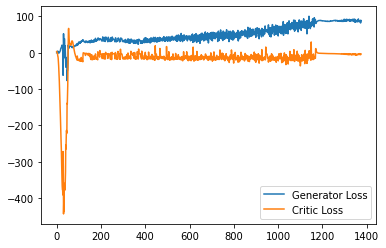

Epoch 59, step 28000: Generator loss: 86.48306256103515, critic loss: -4.640570701110368


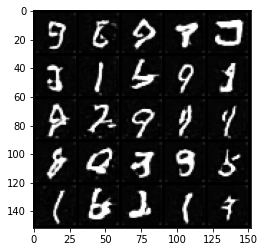

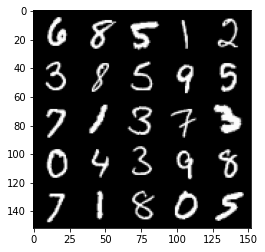

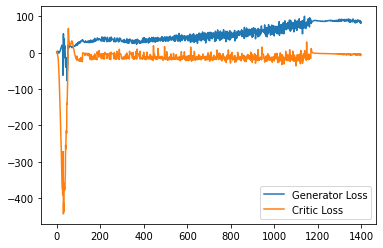

Epoch 60, step 28500: Generator loss: 85.48662077331542, critic loss: -5.327820871150496


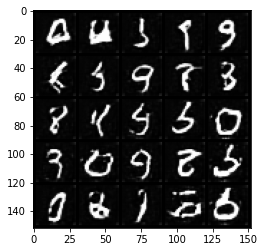

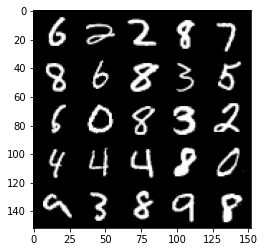

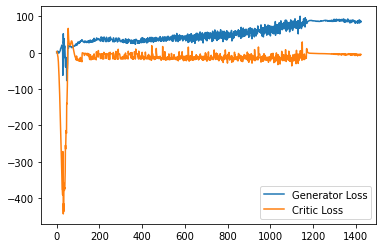

Epoch 61, step 29000: Generator loss: 85.44011575317383, critic loss: -5.021534427261346


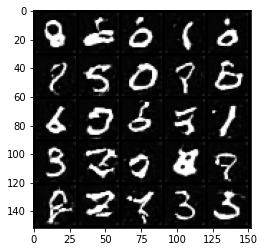

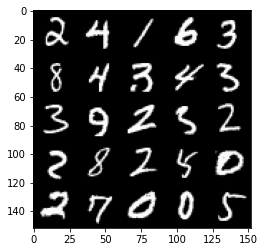

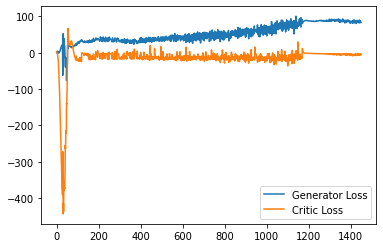

Epoch 62, step 29500: Generator loss: 84.420115234375, critic loss: -5.535626873803137


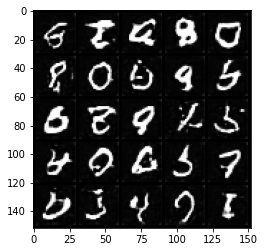

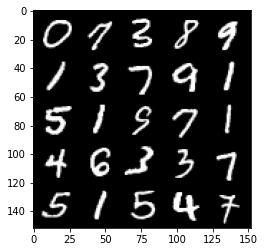

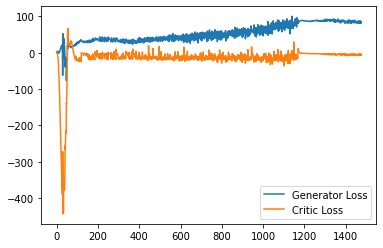

Epoch 63, step 30000: Generator loss: 83.25004909515381, critic loss: -6.214665031450985


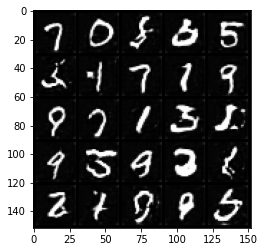

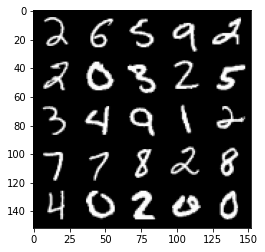

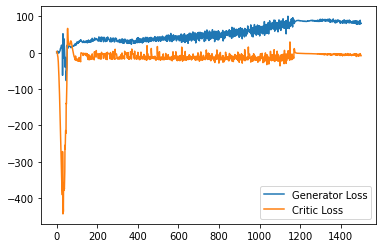

Epoch 65, step 30500: Generator loss: 83.0919503479004, critic loss: -6.366979299724105


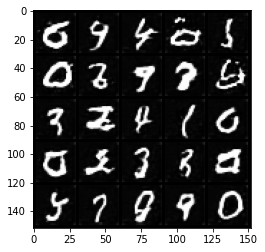

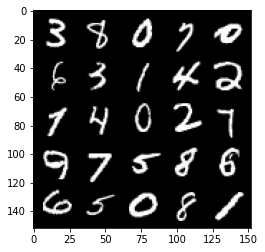

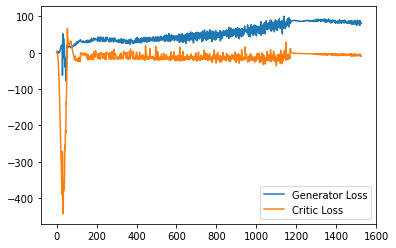

Epoch 66, step 31000: Generator loss: 82.76943759155273, critic loss: -6.611904350280764


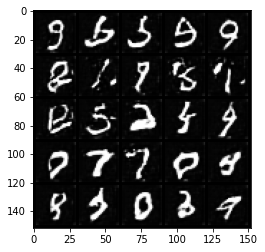

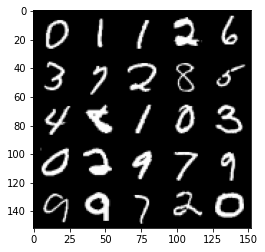

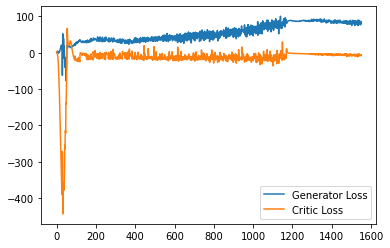

Epoch 67, step 31500: Generator loss: 82.60721047210693, critic loss: -6.667535598254204


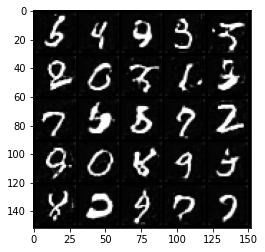

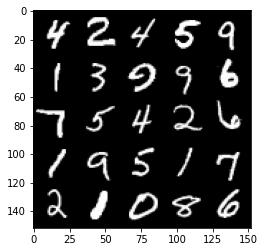

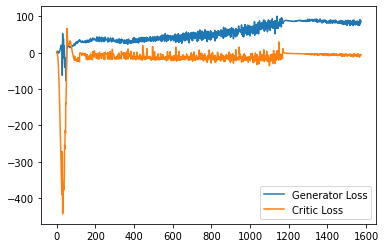

Epoch 68, step 32000: Generator loss: 81.90424015808105, critic loss: -6.232530304455764


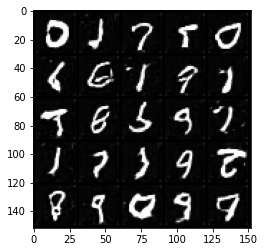

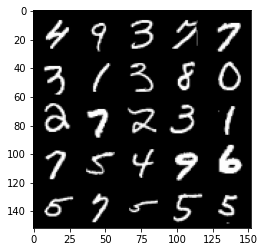

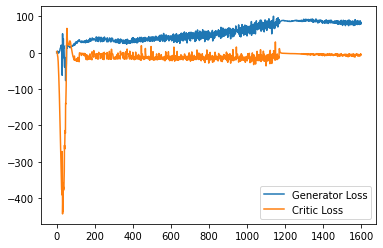

Epoch 69, step 32500: Generator loss: 79.87325505828858, critic loss: -7.290497058379646


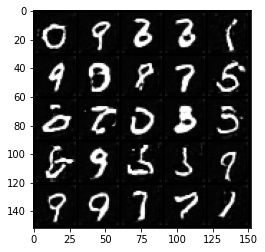

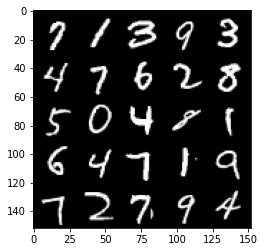

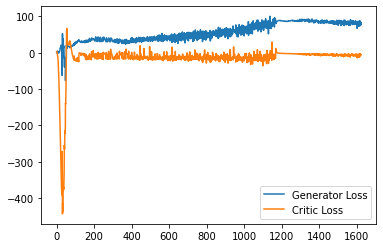

Epoch 70, step 33000: Generator loss: 77.88214268493653, critic loss: -7.762548662137981


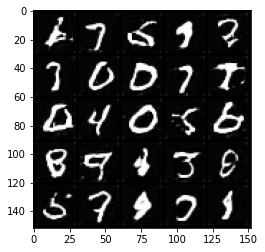

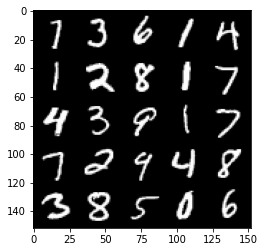

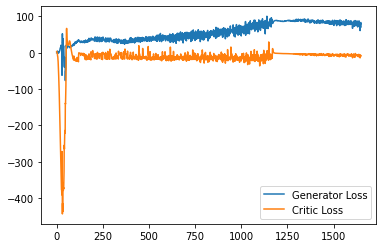

Epoch 71, step 33500: Generator loss: 77.83209636688233, critic loss: -7.51442667656541


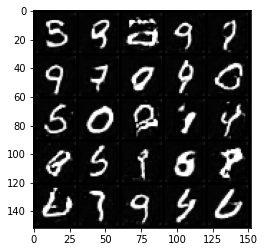

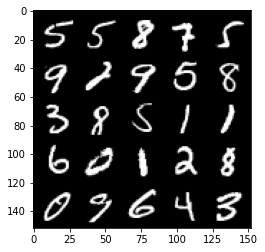

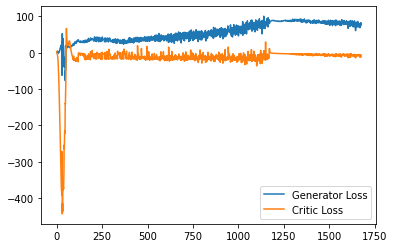

Epoch 72, step 34000: Generator loss: 75.12199452209472, critic loss: -7.395809020841113


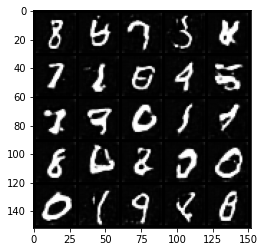

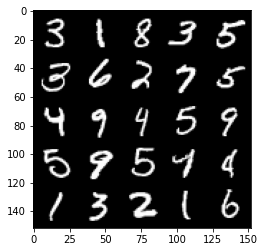

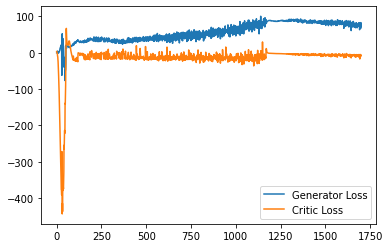

Epoch 73, step 34500: Generator loss: 74.05185682678223, critic loss: -6.914299421012398


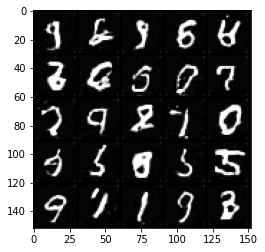

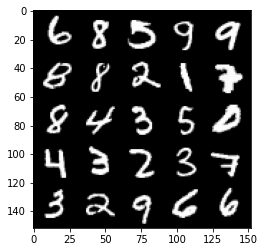

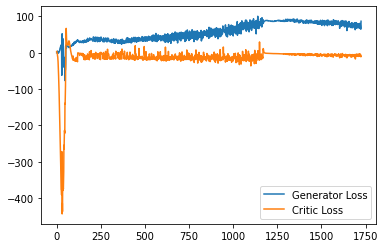

Epoch 74, step 35000: Generator loss: 70.6112592163086, critic loss: -7.839034733307367


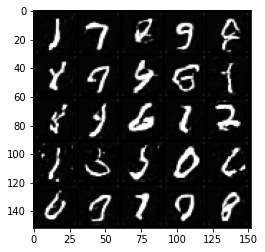

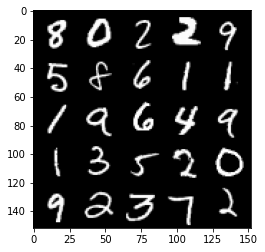

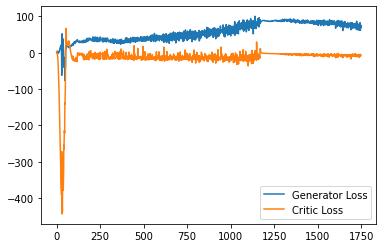

Epoch 75, step 35500: Generator loss: 72.10517433166504, critic loss: -7.335657762277135


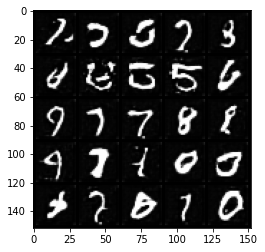

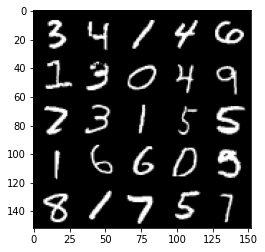

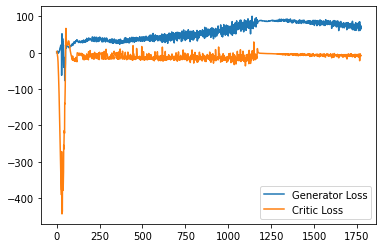

Epoch 76, step 36000: Generator loss: 68.14731079101563, critic loss: -7.563990402930975


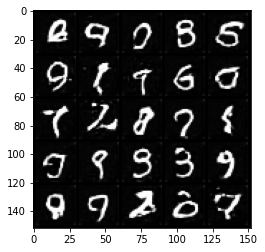

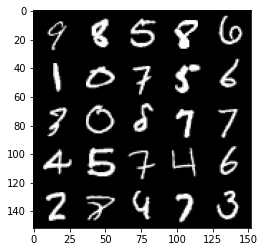

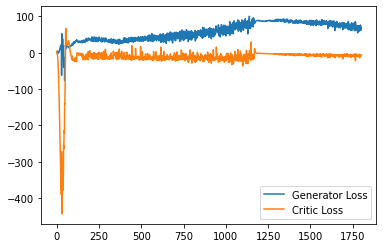

Epoch 77, step 36500: Generator loss: 67.38863220977784, critic loss: -9.846796742784976


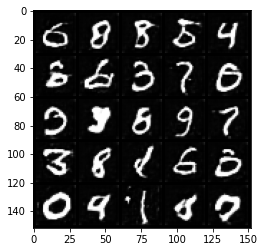

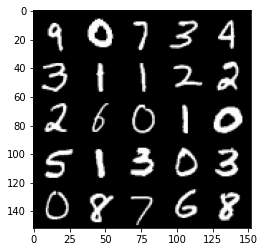

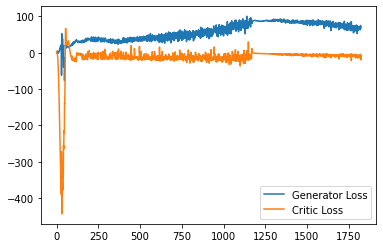

Epoch 78, step 37000: Generator loss: 67.19096651077271, critic loss: -8.06210674594641


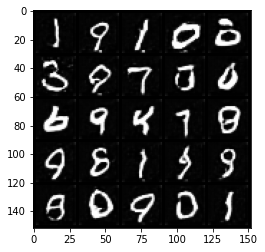

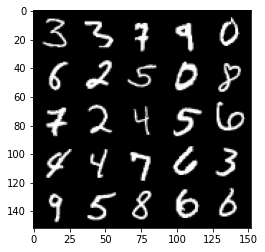

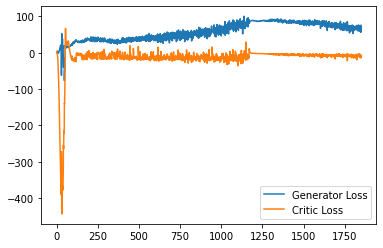

Epoch 79, step 37500: Generator loss: 63.68702410125732, critic loss: -8.876017737019062


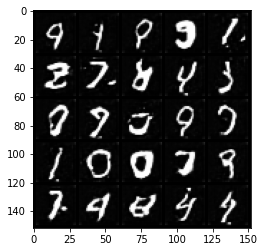

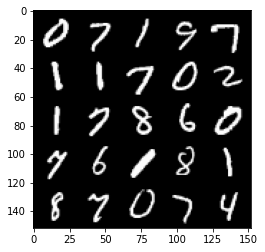

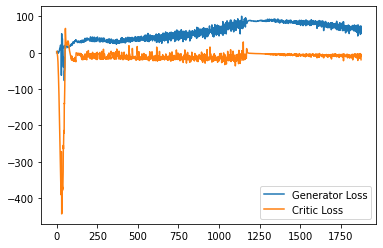

Epoch 81, step 38000: Generator loss: 62.8675959854126, critic loss: -9.060581672734026


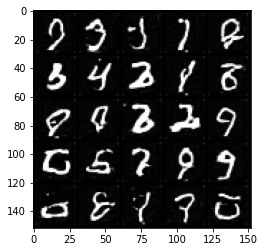

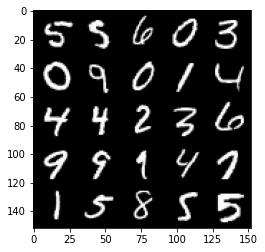

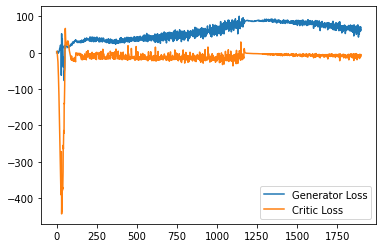

Epoch 82, step 38500: Generator loss: 61.971214496612546, critic loss: -7.4263018311321725


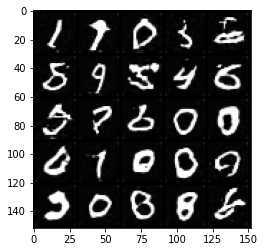

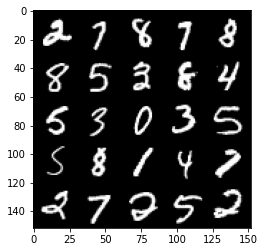

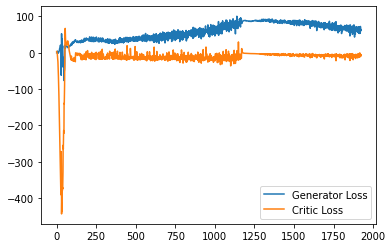

Epoch 83, step 39000: Generator loss: 59.06192902374268, critic loss: -9.337482863008969


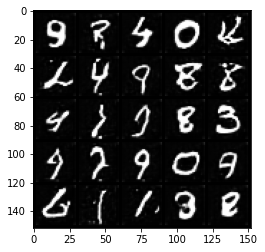

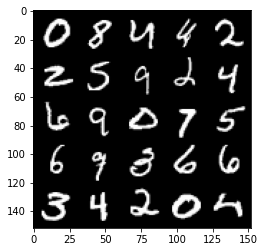

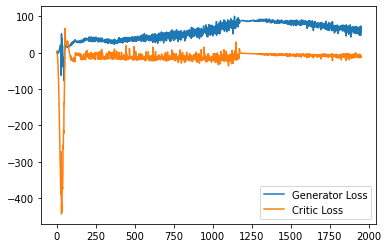

Epoch 84, step 39500: Generator loss: 57.831871360778806, critic loss: -7.6144190294742575


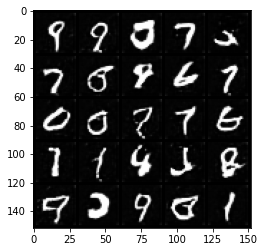

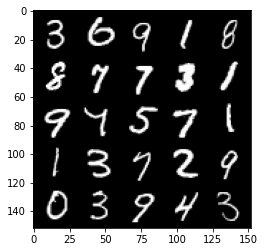

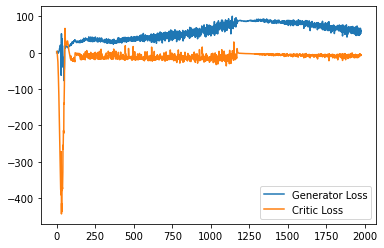

Epoch 85, step 40000: Generator loss: 57.06429305648804, critic loss: -8.867273659741873


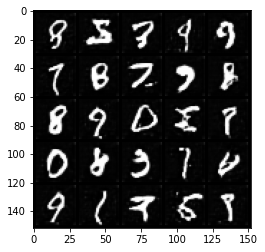

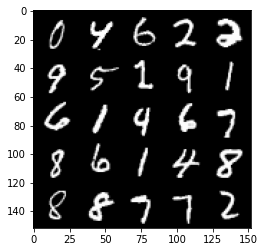

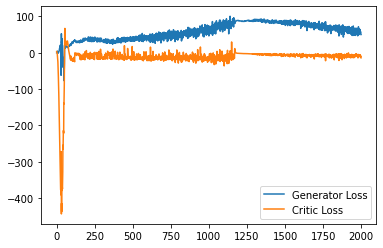

Epoch 86, step 40500: Generator loss: 53.82617953300476, critic loss: -9.62827811279892


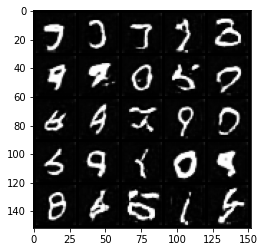

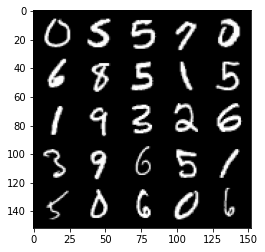

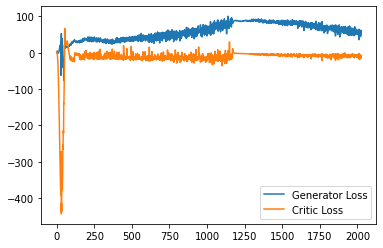

Epoch 87, step 41000: Generator loss: 50.93946358013153, critic loss: -9.368063337743285


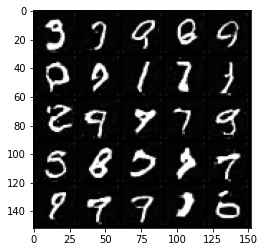

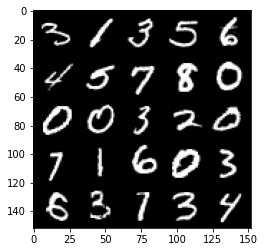

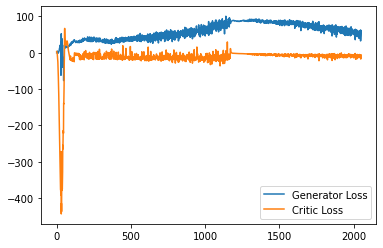

Epoch 88, step 41500: Generator loss: 53.93097260093689, critic loss: -9.07651227019429


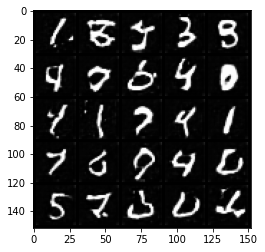

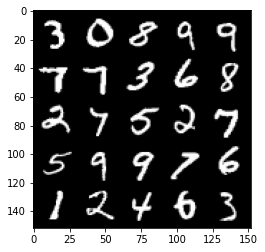

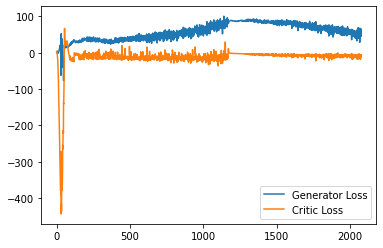

Epoch 89, step 42000: Generator loss: 53.04462438964844, critic loss: -11.680261419874434


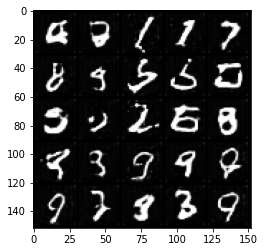

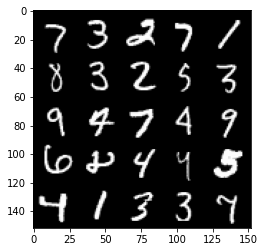

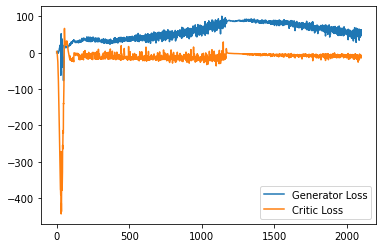

Epoch 90, step 42500: Generator loss: 46.539055123806, critic loss: -10.636921743047246


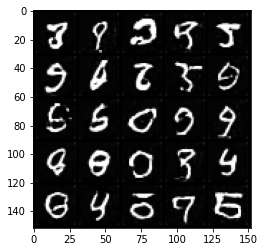

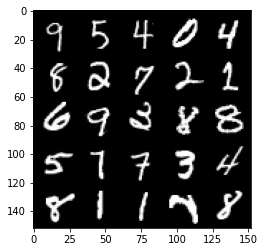

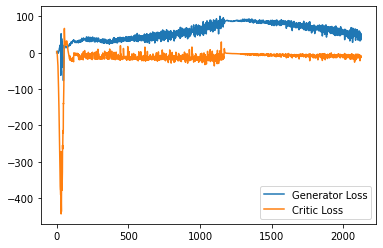

Epoch 91, step 43000: Generator loss: 50.564843997716906, critic loss: -9.980748762440676


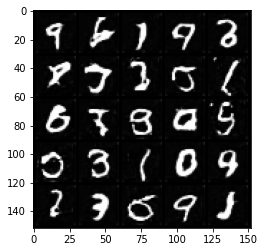

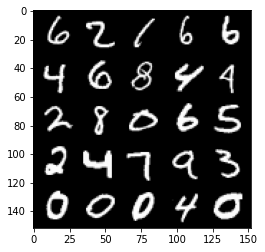

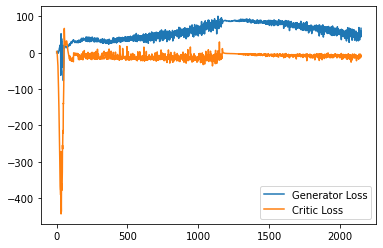

Epoch 92, step 43500: Generator loss: 50.370771266937254, critic loss: -9.567451352816825


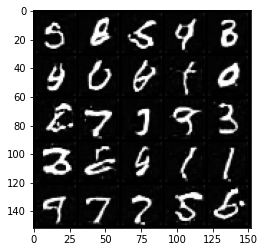

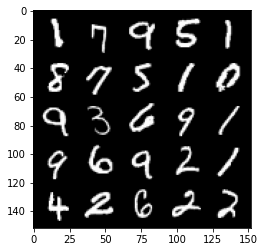

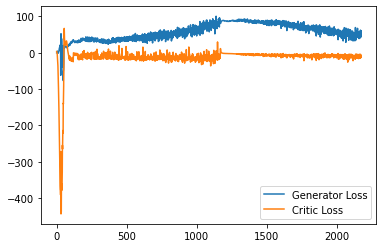

Epoch 93, step 44000: Generator loss: 52.0830333545208, critic loss: -12.10329520484209


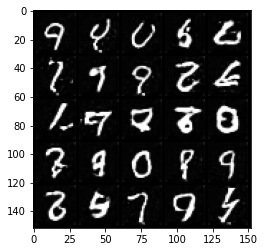

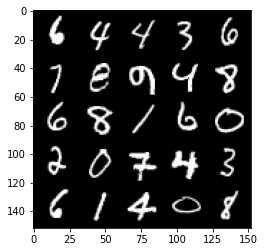

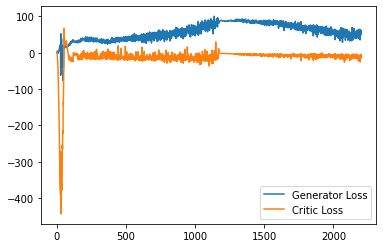

Epoch 94, step 44500: Generator loss: 49.16715254282951, critic loss: -9.852500947129734


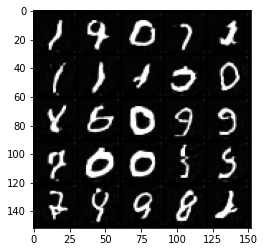

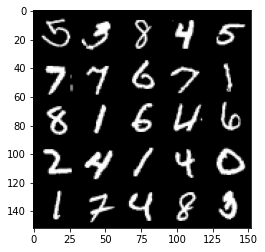

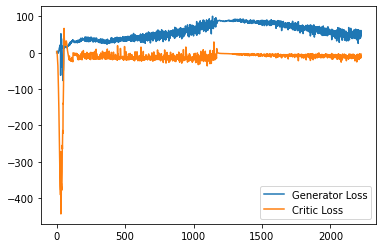

Epoch 95, step 45000: Generator loss: 48.37223956871033, critic loss: -11.591788827174906


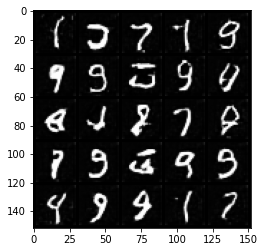

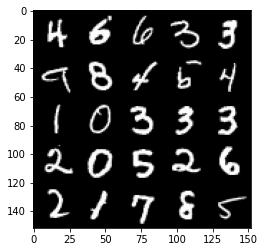

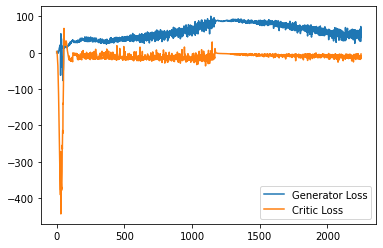

Epoch 97, step 45500: Generator loss: 49.72750548887253, critic loss: -10.850613077384226


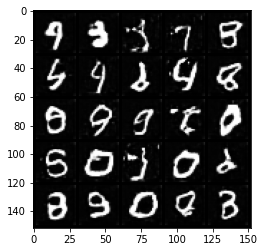

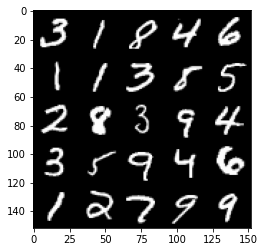

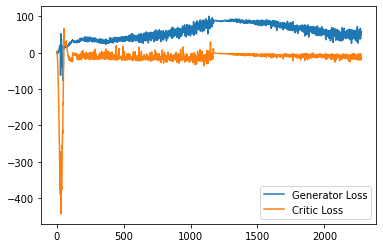

Epoch 98, step 46000: Generator loss: 45.224956497728826, critic loss: -11.247409825378654


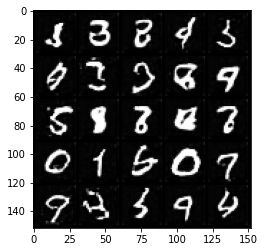

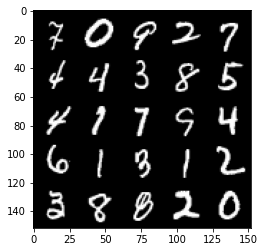

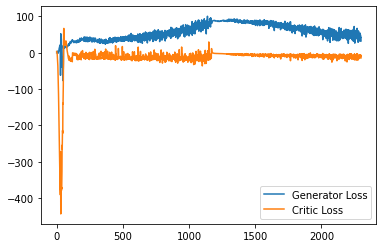

Epoch 99, step 46500: Generator loss: 43.91380302742124, critic loss: -13.011586345219614


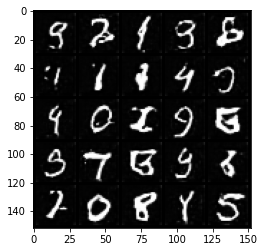

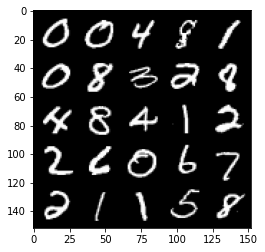

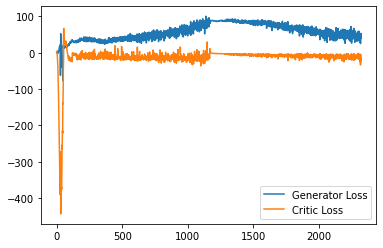

In [14]:
import matplotlib.pyplot as plt

cur_step = 0
generator_losses = []
critic_losses = []
for epoch in range(n_epochs):
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.to(device)

        mean_iteration_critic_loss = 0
        for _ in range(crit_repeats):
            ### Update critic ###
            crit_opt.zero_grad()
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            crit_fake_pred = crit(fake.detach())
            crit_real_pred = crit(real)

            epsilon = torch.rand(len(real), 1, 1, 1, device=device, requires_grad=True)
            gradient = get_gradient(crit, real, fake.detach(), epsilon)
            gp = gradient_penalty(gradient)
            crit_loss = get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda)

            # Keep track of the average critic loss in this batch
            mean_iteration_critic_loss += crit_loss.item() / crit_repeats
            # Update gradients
            crit_loss.backward(retain_graph=True)
            # Update optimizer
            crit_opt.step()
        critic_losses += [mean_iteration_critic_loss]

        ### Update generator ###
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
        fake_2 = gen(fake_noise_2)
        crit_fake_pred = crit(fake_2)
        
        gen_loss = get_gen_loss(crit_fake_pred)
        gen_loss.backward()

        # Update the weights
        gen_opt.step()

        # Keep track of the average generator loss
        generator_losses += [gen_loss.item()]

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            crit_mean = sum(critic_losses[-display_step:]) / display_step
            print(f"Epoch {epoch}, step {cur_step}: Generator loss: {gen_mean}, critic loss: {crit_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(critic_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Critic Loss"
            )
            plt.legend()
            plt.show()

        cur_step += 1
